## **Project Title :**<br> 
#### **Enhancing and Reconstructing Images using Superresolution and Random Fourier Features**<br>

This project focuses on enhancing image resolution and reconstructing images with missing data using advanced machine learning techniques. Specifically, it applies superresolution to enhance image quality and employs Random Fourier Features (RFF) combined with linear regression for image reconstruction. The project involves both qualitative and quantitative analyses to evaluate the performance of these methods. Key tasks include superresolution enhancement, measuring reconstruction accuracy with various metrics, and handling images with different levels of missing data

---

In [1]:
!pip install einops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 2.6 MB/s eta 0:00:00


In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt 
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warning
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os   # Provides functions for interacting with the operating system.
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

'''
The einops module simplifies manipulating and reshaping tensors in deep learning libraries like PyTorch and TensorFlow, offering a more readable and efficient way to perform common operations.
'''

try:
    from einops import rearrange 
except ImportError:
    %pip install einops
    from einops import rearrange

In [3]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

--2024-03-06 11:57:36--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 18.65.39.42, 18.65.39.29, 18.65.39.54, ...
Connecting to segment-anything.com (segment-anything.com)|18.65.39.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: 'dog.jpg'

dog.jpg             100%[===================>] 216.61K  --.-KB/s    in 0.01s   

2024-03-06 11:57:36 (17.1 MB/s) - 'dog.jpg' saved [221810/221810]



In [4]:
# Read in a image form torchvision
img = torchvision.io.read_image('dog.jpg')
print(img.shape)

torch.Size([3, 1365, 2048])


'\nThe rearrange function from einops is used to rearrange the dimensions of an image tensor img.\nDifferent libraries or functions have different expectations for the order of image data dimensions. For instance, matplotlib expects images in (height, width, channels) format, while PyTorch and TensorFlow often use (channels, height, width) internally.\nThis rearrangement allows you to use an image loaded or processed in one library (e.g., PyTorch) with a function or visualization tool (e.g., matplotlib) from another library that has different format requirements.\n'

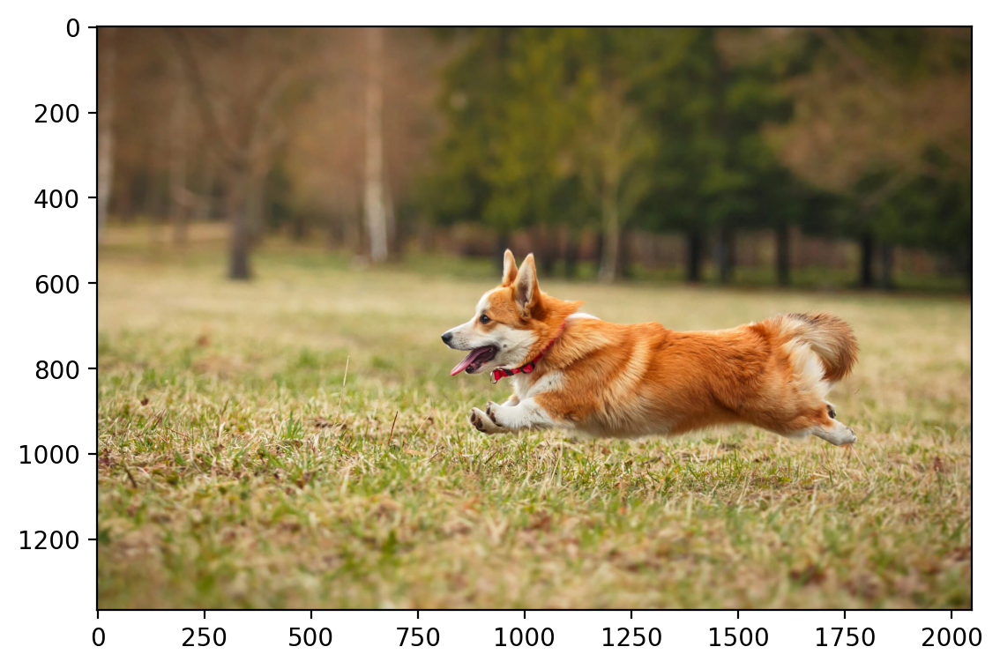

In [5]:
plt.imshow(rearrange(img,'c h w -> h w c').numpy())
'''
The rearrange function from einops is used to rearrange the dimensions of an image tensor img.
Different libraries or functions have different expectations for the order of image data dimensions. For instance, matplotlib expects images in (height, width, channels) format, while PyTorch and TensorFlow often use (channels, height, width) internally.
This rearrangement allows you to use an image loaded or processed in one library (e.g., PyTorch) with a function or visualization tool (e.g., matplotlib) from another library that has different format requirements.
'''

In [6]:
from sklearn import preprocessing
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1,1))
'''
It creates a MinMaxScaler object from the preprocessing module, designed to normalize data to a specific range (usually 0 to 1).
The img.reshape(-1, 1) part reshapes the image data into a 2D array with one column, preparing it for scaling.
The code prepares a tool to "standardize" image data to ensure values fall within a consistent range. This often improves performance in machine learning or other numerical
tasks.
'''
scaler_img

MinMaxScaler()

In [7]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)  #.reshape(img.shape) = reshapes the scaled data back to its original shape (img.shape). 
img_scaled.shape

(3, 1365, 2048)

In [8]:
img_scaled = torch.tensor(img_scaled) #img_scaled = torch.tensor(img_scaled) converts the scaled data (now a NumPy array) into a PyTorch tensor. PyTorch often expects data in tensor format for various operations.

In [9]:
img_scaled = img_scaled.to(device)

In [10]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(),600,800,300,300)
'''
(600,800) = Starts of the origin to crop the origin.
(300,300) = Extend upto which image should be cropped from original image.
'''
crop.shape

torch.Size([3, 300, 300])

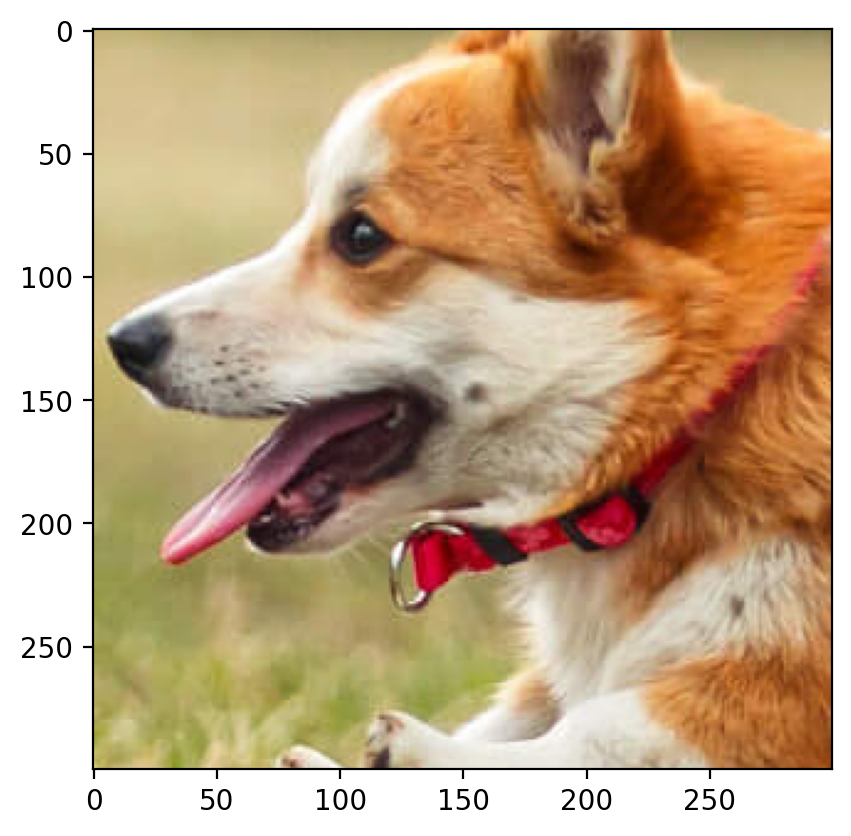

In [11]:
plt.imshow(rearrange(crop,'c h w -> h w c').cpu().numpy())

In [12]:
crop = crop.to(device)

In [13]:
# Get the dimensions of the image tensor
num_channels,height,width = crop.shape  #num_channels is the RGB values used
print(num_channels,height,width)

3 300 300


---

## **Training the Model**

In [14]:
def create_coordinate_map(img, scale=1):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(0, width,  1/scale).repeat(int(height*scale), 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(int(width*scale), 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [15]:
dog_X, dog_Y = create_coordinate_map(crop)
dog_X.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [16]:
def MinMax(dog_X):

    scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

    # Scale the X coordinates
    dog_X_scaled = scaler_X.transform(dog_X.cpu())

    # Move the scaled X coordinates to the GPU
    dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

    # Set to dtype float32
    dog_X_scaled = dog_X_scaled.float()
    return dog_X_scaled

dog_X_scaled = MinMax(dog_X)

In [17]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)

In [18]:
def train(net, lr, X, Y, epochs, verbose=True, out=0):

  criterion = nn.MSELoss()
  optimizer = torch.optim.Adam(net.parameters(), lr=lr)
  for epoch in range(epochs):
    optimizer.zero_grad()
    outputs = net(X)

    # Calculate per-sample MSE loss
    masked_outputs = torch.masked_select(outputs, ~torch.isnan(Y))  # Mask out nan values
    masked_Y = torch.masked_select(Y, ~torch.isnan(Y))  # Mask out nan values
    loss = criterion(masked_outputs, masked_Y)

    loss.backward()
    optimizer.step()
    if verbose and epoch % 100 == 0:
      print(f"Epoch {epoch} loss: {loss.item():.6f}")

  return loss.item()

In [19]:
def plot_reconstructed_and_original_image(original_img, net, X, title="",scale=1):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height*scale, width*scale, num_channels)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")
    

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()

In [20]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state = 42)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [21]:
X_rff = create_rff_features(dog_X_scaled, 5000, 0.008)
X_rff.shape

torch.Size([90000, 5000])

In [22]:
net = LinearModel(X_rff.shape[1], 3).to(device)

train(net, 0.005, X_rff, dog_Y, 2000)

Epoch 0 loss: 0.368277
Epoch 100 loss: 0.064797
Epoch 200 loss: 0.030651
Epoch 300 loss: 0.027134
Epoch 400 loss: 0.025765
Epoch 500 loss: 0.024846
Epoch 600 loss: 0.024179
Epoch 700 loss: 0.023671
Epoch 800 loss: 0.023270
Epoch 900 loss: 0.022945
Epoch 1000 loss: 0.022677
Epoch 1100 loss: 0.022452
Epoch 1200 loss: 0.022262
Epoch 1300 loss: 0.022099
Epoch 1400 loss: 0.021957
Epoch 1500 loss: 0.021834
Epoch 1600 loss: 0.021725
Epoch 1700 loss: 0.021628
Epoch 1800 loss: 0.021541
Epoch 1900 loss: 0.021463


0.02139321155846119

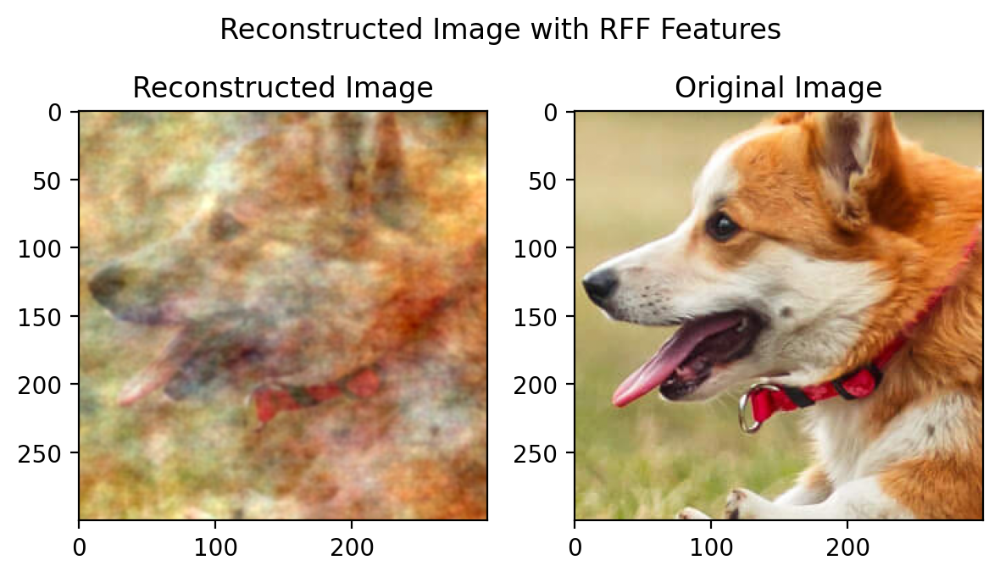

In [23]:
plot_reconstructed_and_original_image(crop, net, X_rff, title="Reconstructed Image with RFF Features")

In [24]:
del X_rff
torch.cuda.empty_cache()

---

# **Superresolution Enhancement**:
**Performing Superresolution on the image to enhance its resolution by factor `2`. Displaying a qualitative comparison of original and reconstructed image.**

In [25]:
X_sup,Y_sup = create_coordinate_map(crop, scale=2)
X_sup.shape,Y_sup.shape

(torch.Size([360000, 2]), torch.Size([90000, 3]))

In [26]:
scaled_X_sup = MinMax(X_sup)

In [27]:
scaled_X_sup_rff = create_rff_features(scaled_X_sup, 5000, 0.008)

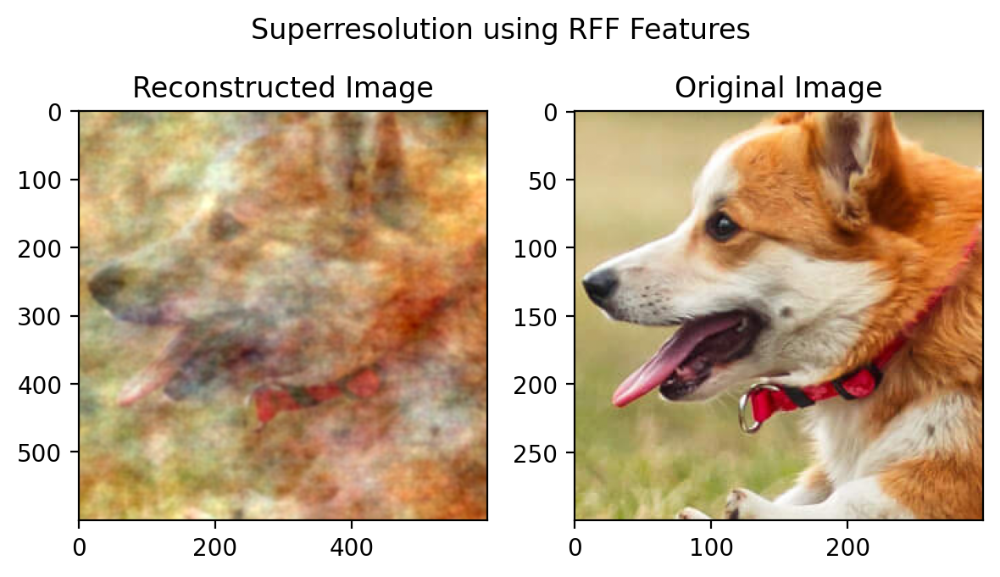

In [28]:
plot_reconstructed_and_original_image(crop, net, scaled_X_sup_rff, title="Superresolution using RFF Features",scale=2)

In [29]:
del scaled_X_sup_rff
torch.cuda.empty_cache()

---

# **Quantitative Comparison of Superresolution**<br>
**The above only helps us with a qualitative comparison. Let us now do a quantitative comparison. Some helpful article: https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Super-Resolution**
- **Starting with a 400x400 image (ground truth high resolution).**
- **Resizing it to a 200x200 image (input image)**
- **Using RFF + Linear regression to increase the resolution to 400x400 (predicted high resolution image)**
- **Computing the following metrics:**
    - **RMSE on predicted v/s ground truth high resolution image**
    - **Peak SNR**

In [30]:
crop_2 = torchvision.transforms.functional.crop(img_scaled.cpu(),600,800,400,400)
crop_2.shape

torch.Size([3, 400, 400])

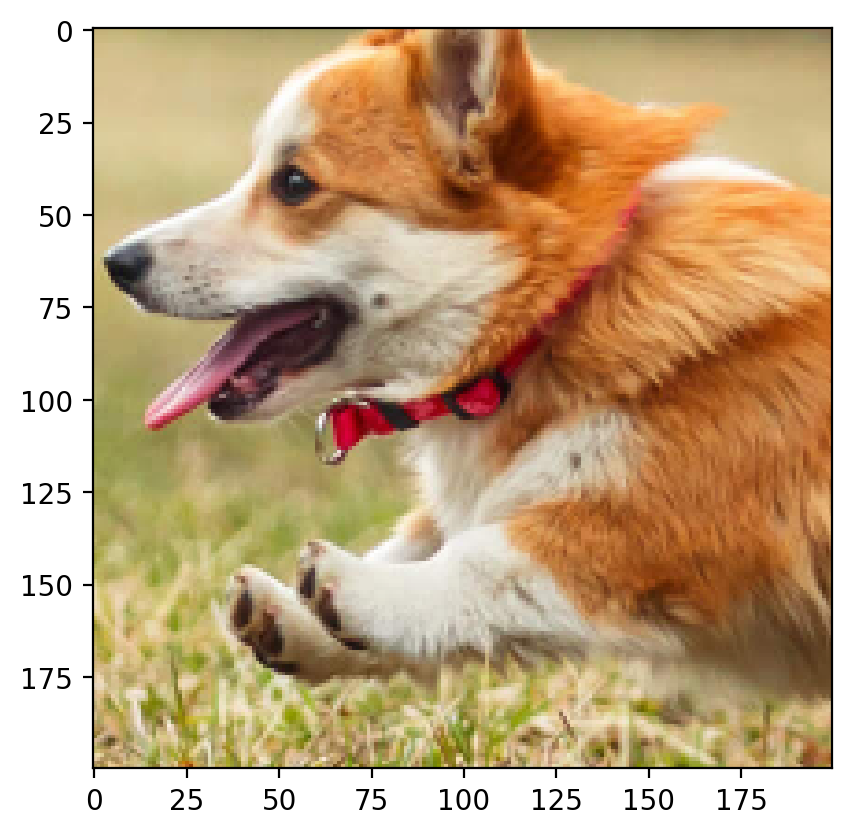

In [31]:
# Define the transform
resize = transforms.Resize((200, 200))

# Apply the transform to the cropped image
crop_2_resized = resize(crop_2)

# Plot the resized image
plt.imshow(rearrange(crop_2_resized, 'c h w -> h w c').cpu().numpy())

In [32]:
crop_2_X,crop_2_Y = create_coordinate_map(crop_2)

In [33]:
resized_X,resized_Y = create_coordinate_map(crop_2_resized)
resized_X.shape,resized_Y.shape

(torch.Size([40000, 2]), torch.Size([40000, 3]))

In [34]:
resized_dog_X_scaled = MinMax(resized_X)

In [35]:
resized_X_rff = create_rff_features(resized_dog_X_scaled, 5000, 0.008)

In [36]:
resized_net = LinearModel(resized_X_rff.shape[1], 3).to(device)

resized_Y = resized_Y.to(device)

loss = train(resized_net, 0.005, resized_X_rff, resized_Y, 2000)
print("\nLoss after 2000 epoch :",loss)

Epoch 0 loss: 0.356893
Epoch 100 loss: 0.059780
Epoch 200 loss: 0.027597
Epoch 300 loss: 0.024936
Epoch 400 loss: 0.024125
Epoch 500 loss: 0.023602
Epoch 600 loss: 0.023219
Epoch 700 loss: 0.022922
Epoch 800 loss: 0.022683
Epoch 900 loss: 0.022486
Epoch 1000 loss: 0.022319
Epoch 1100 loss: 0.022176
Epoch 1200 loss: 0.022053
Epoch 1300 loss: 0.021945
Epoch 1400 loss: 0.021851
Epoch 1500 loss: 0.021768
Epoch 1600 loss: 0.021695
Epoch 1700 loss: 0.021630
Epoch 1800 loss: 0.021572
Epoch 1900 loss: 0.021522

Loss after 2000 epoch : 0.02147669717669487


For Testing Purpose

In [37]:
X_resized_test,Y_resized_test = create_coordinate_map(crop_2)
X_resized_test.shape,Y_resized_test.shape

(torch.Size([160000, 2]), torch.Size([160000, 3]))

In [38]:
resized_dog_X_scaled_test = MinMax(X_resized_test)

In [39]:
resized_X_rff_test = create_rff_features(resized_dog_X_scaled_test, 5000, 0.008)

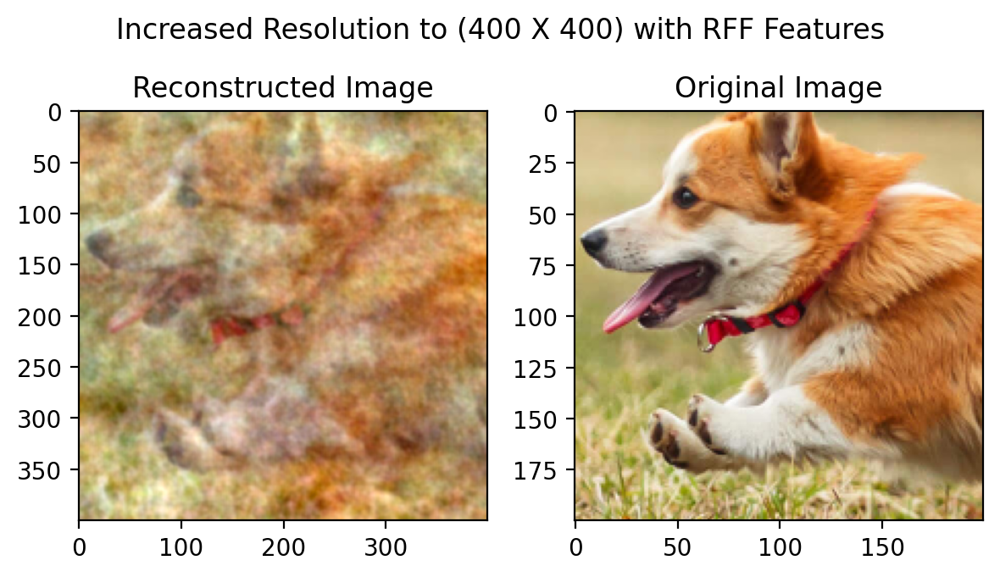

In [40]:
plot_reconstructed_and_original_image(crop_2_resized, resized_net, resized_X_rff_test, title="Increased Resolution to (400 X 400) with RFF Features",scale=2)

For calculating Metrices

In [41]:
def calculate_rmse(pred_img, original_img):

    squared_diff = (pred_img - original_img) ** 2
    mean_squared_diff = torch.mean(squared_diff)
    rmse = torch.sqrt(mean_squared_diff)
    return rmse.item()

def calculate_psnr(rmse):

    max_pixel_value = 1
    psnr = 20 * np.log10(max_pixel_value / rmse)
    return psnr

pred_img = resized_net(resized_X_rff_test)
pred_img = pred_img.cpu() if pred_img.device.type == 'cuda' else pred_img 
crop_2_Y = crop_2_Y.cpu() if crop_2_Y.device.type == 'cuda' else crop_2_Y

rmse_output = calculate_rmse(pred_img, crop_2_Y)
print("\nRMSE on **Predicted** v/s **Ground truth high resolution** :",rmse_output)

psnr_output = calculate_psnr(rmse_output)
print("\nPeak SNR :",psnr_output,"db")


RMSE on **Predicted** v/s **Ground truth high resolution** : 0.1482846885919571

Peak SNR : 16.578073810628965 db


### **Observation :** <br>

Using `5000` *RFF features* yielded a *PSNR* of `16.57`, indicating *acceptable* image quality considering computational constraints. Limited features may compromise finer details, but balance computational complexity. PSNR varies with image complexity; simpler images achieve higher PSNR with fewer features. *Increased feature count maybe required for improved PSNR value.*

Similarly the RMSE value is also quite low indicating good performance given the number of features to be 5000.

In [42]:
del resized_X_rff
torch.cuda.empty_cache()

---

# **Image Reconstruction with Missing Data**<br>
***Completing Image with Random Missing Data*: Appling RFF to complete the image with 10%, 20%, and so on up to 90% of its data missing randomly. Randomly removing portions of the data, training the model on the remaining data, and predicting on the entire image. Display the reconstructed images for each missing data percentage and the metrics calculated above.**

For Removing the random missing data from the image

In [43]:
def mask_image_rgb(img, prop):
    img_copy = img.clone().cpu()
    mask = torch.rand(img.shape[1:]) < prop
    for i in range(img.shape[0]):
        img_copy[i][mask] = float("nan")
    img_copy_np = img_copy.numpy()
    return img_copy_np, mask

In [44]:
def plot_reconstructed_and_original_image_2(original_img, net, X, removed_img, i, title="", scale=1):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)

    fig = plt.figure(figsize=(11, 5))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax2 = plt.subplot(gs[2])

    ax0.imshow(original_img.cpu().permute(1, 2, 0))
    ax0.set_title("Original Image")

    ax1.imshow(removed_img.cpu().permute(1, 2, 0))
    ax1.set_title(f"Removed Percentage ({i}%) Image ")

    ax2.imshow(outputs.reshape(height*scale, width*scale, num_channels).cpu())
    ax2.set_title("Predicted Image")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()


Loss after 2000 epoch after 10% pixel removed : 0.0212439876049757
RMSE on **Predicted** v/s **Ground truth high resolution** for 10% : 0.14680814743041992
Peak SNR for 10% : 16.66499683310112 db
---------------------------------------------------------------------------------------------------------------------------------------------------------------------
Loss after 2000 epoch after 20% pixel removed : 0.021152101457118988
RMSE on **Predicted** v/s **Ground truth high resolution** for 20% : 0.1475398689508438
Peak SNR for 20% : 16.62181213260642 db
---------------------------------------------------------------------------------------------------------------------------------------------------------------------
Loss after 2000 epoch after 30% pixel removed : 0.02079143188893795
RMSE on **Predicted** v/s **Ground truth high resolution** for 30% : 0.14832299947738647
Peak SNR for 30% : 16.57583001090285 db
------------------------------------------------------------------------------

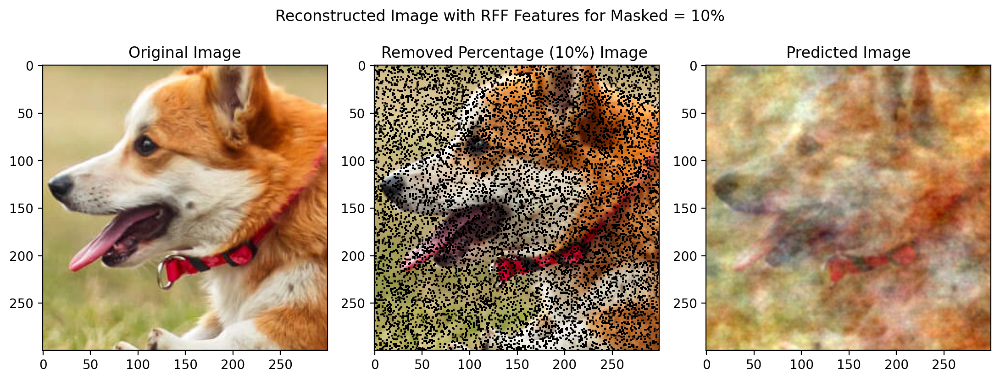

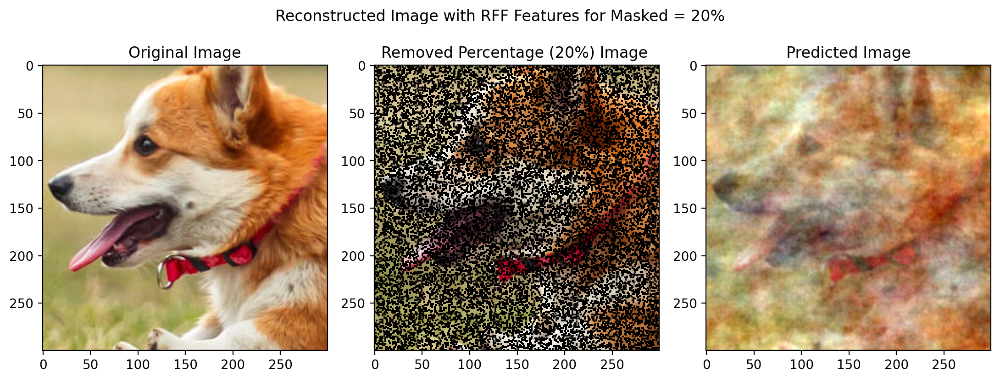

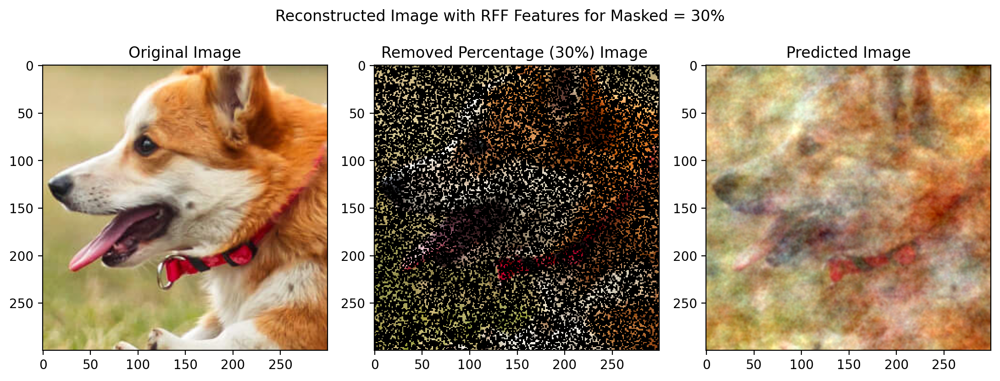

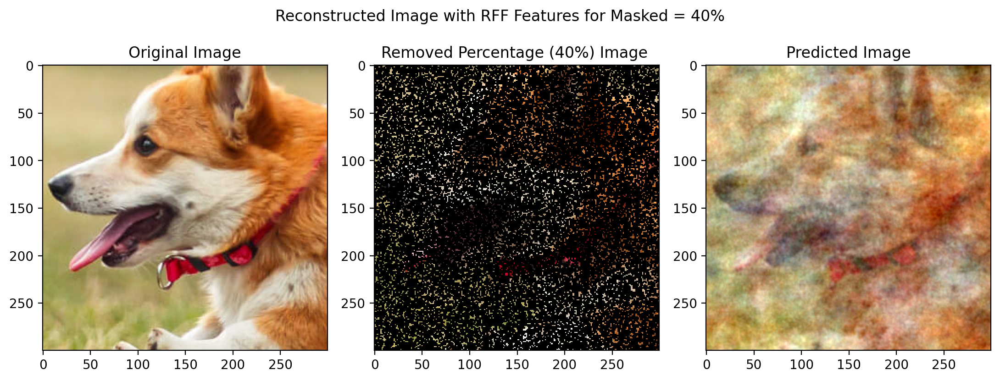

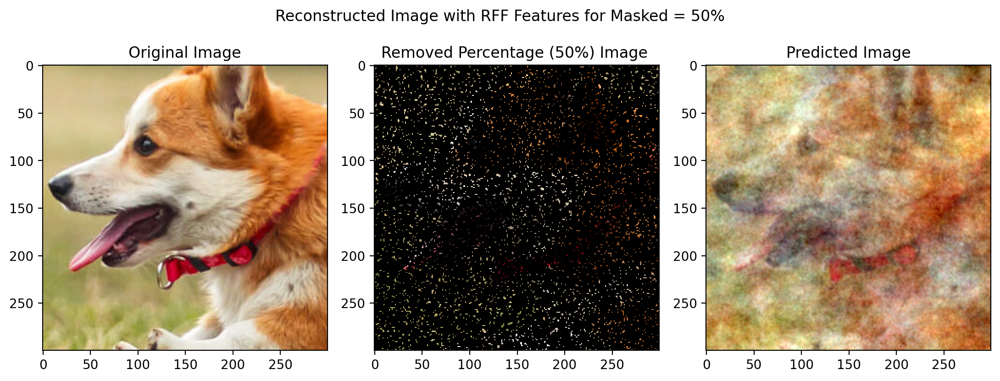

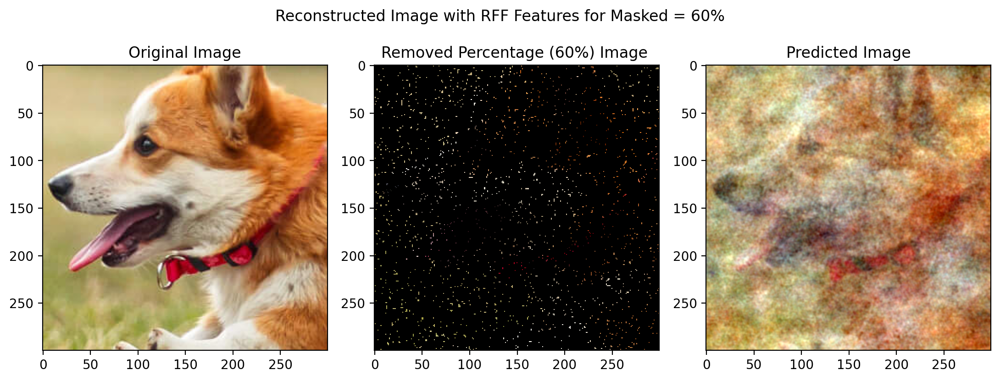

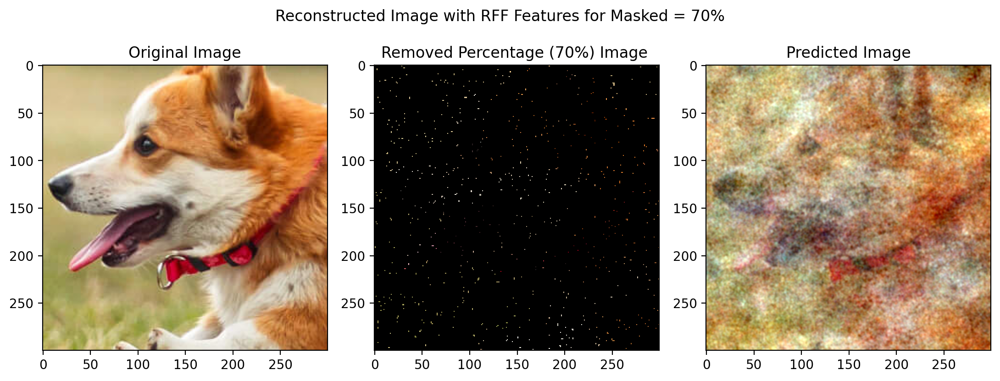

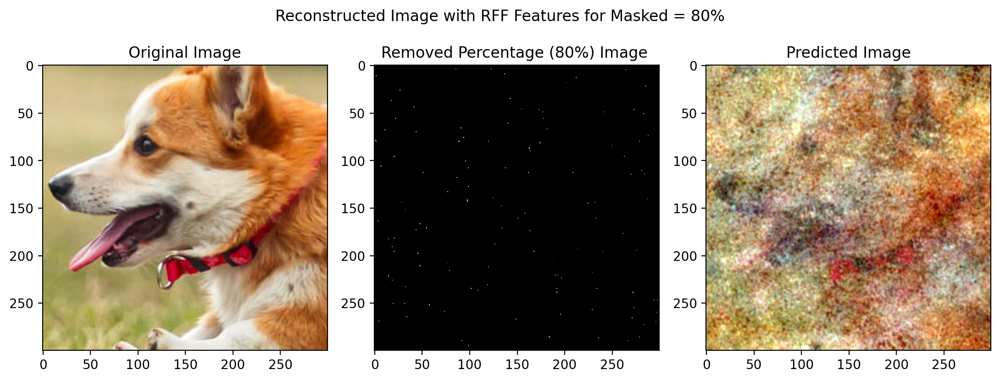

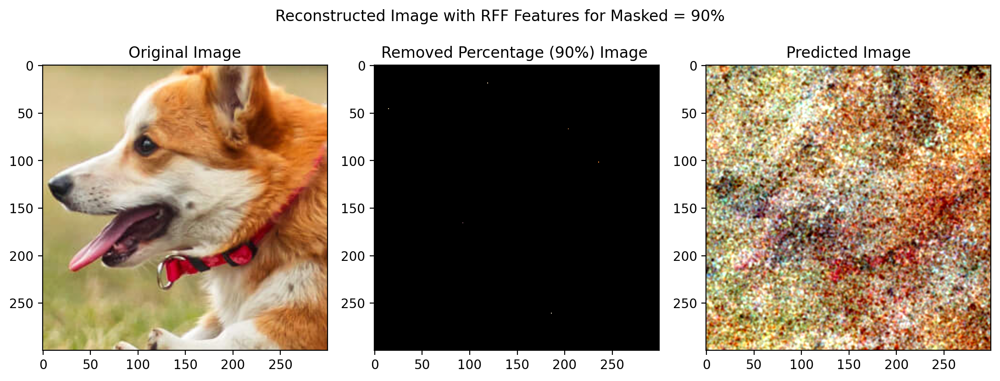

In [46]:
rmse_arr = []
psnr_arr = []

dog_Y_cpu = dog_Y.cpu() if dog_Y.device.type == 'cuda' else dog_Y

for i in range(1,10):

    masked_img_np_i, _ = mask_image_rgb(crop,i/10)
    masked_img_tensor_i = torch.tensor(masked_img_np_i).float().to(device)

    dog_X_i,dog_Y_i = create_coordinate_map(masked_img_tensor_i,scale=1)
    scaled_dog_X_i = MinMax(dog_X_i)
    dog_rff_i = create_rff_features(scaled_dog_X_i,5000,0.008)

    # Training the model for percentage removed pixel
    net_i = LinearModel(dog_rff_i.shape[1], 3).to(device)
    loss_i = train(net_i, 0.005, dog_rff_i, dog_Y_i, 2000,verbose=False)
    print(f"Loss after 2000 epoch after {i*10}% pixel removed :",loss_i)

    # For Calculating Metrics
    pred_img_i = net_i(dog_rff_i)
    outputs_i = pred_img_i.cpu() if pred_img_i.device.type == 'cuda' else pred_img_i

    # For calculating RMSE
    rmse_output_i = calculate_rmse(outputs_i, dog_Y_cpu)
    rmse_arr.append(rmse_output_i)
    print(f"RMSE on **Predicted** v/s **Ground truth high resolution** for {i*10}% :",rmse_output_i)

    # For calculating PSNR
    psnr_output_i = calculate_psnr(rmse_output_i)
    psnr_arr.append(psnr_output_i)
    print(f"Peak SNR for {i*10}% :",psnr_output_i,"db")

    # For plotting
    plot_reconstructed_and_original_image_2(crop,net_i,dog_rff_i,masked_img_tensor_i,i*10,title=f"Reconstructed Image with RFF Features for Masked = {i*10}%")
    del dog_rff_i
    print("---------------------------------------------------------------------------------------------------------------------------------------------------------------------")

In [48]:
torch.cuda.empty_cache()

For visualization of the trends in RMSE and Peak SNR values against the missing data

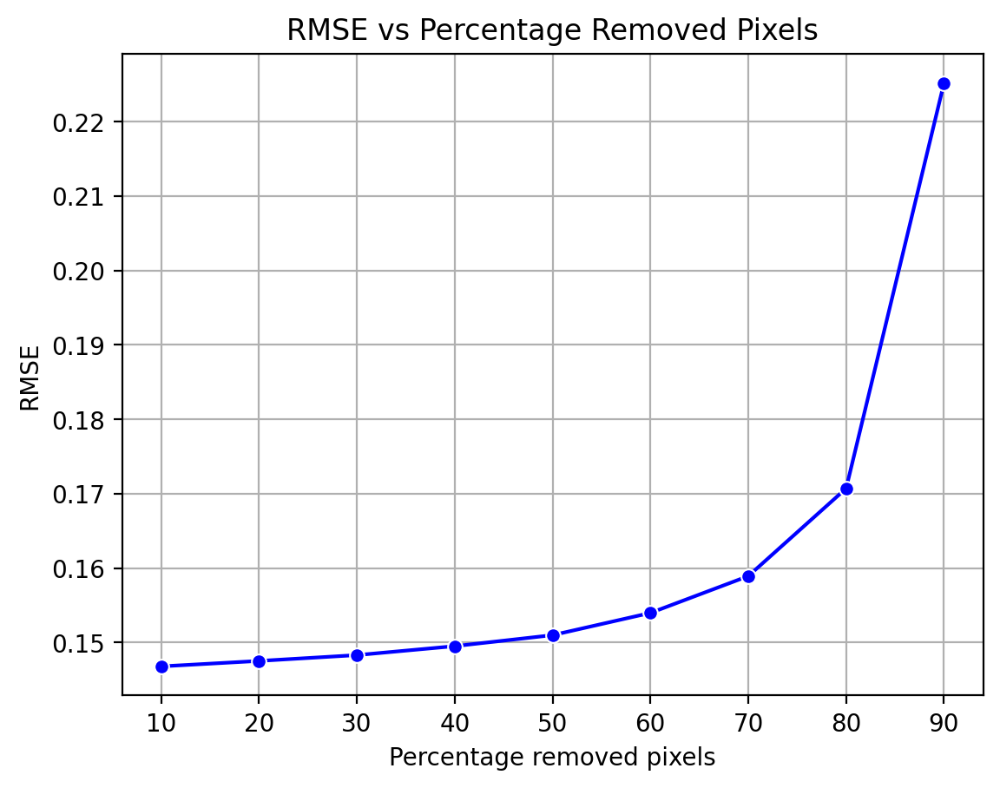

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lineplot(x=[10,20,30,40,50,60,70,80,90], y=rmse_arr, marker="o", color="blue")
plt.xlabel("Percentage removed pixels")
plt.ylabel("RMSE")
plt.title("RMSE vs Percentage Removed Pixels")
plt.grid()
plt.show()


## **Observation :**<br>

The RMSE value for 10% data removed is `0.14680814743041992` and for the 90% data is `0.22517310082912445` which is increased by `0.078365`.<br> Because of the following points : 

1. **Decreased Information for Training**: With an increasing percentage of missing data from `10%` to `90%`, the model receives less information during training. Less data makes it hard for the model to find patterns, so it predicts less accurately. If there's not enough data, the model can't figure out what's important, so its guesses might not be very good. This shows that having lots of good data is really important for teaching the model how to make good predictions.

2. **Increased Uncertainty in Predictions**: Higher levels of missing data amplify the uncertainty in the model's predictions. In regions where data is absent, the model must rely on `extrapolation or assumptions`, resulting in *less reliable predictions and higher RMSE values.*

4. **Model's Capacity and Complexity**: The model's ability to handle missing data depends on how complex it is. In our case we have used `5000 RFF features` and trained it for `2000 epochs`. A more complicated model can understand more complicated patterns, but if there's a lot of missing data or the missing parts are all over the place, even a complicated model might have trouble figuring things out. So, even though the model is smart, it still needs enough good data to learn from.

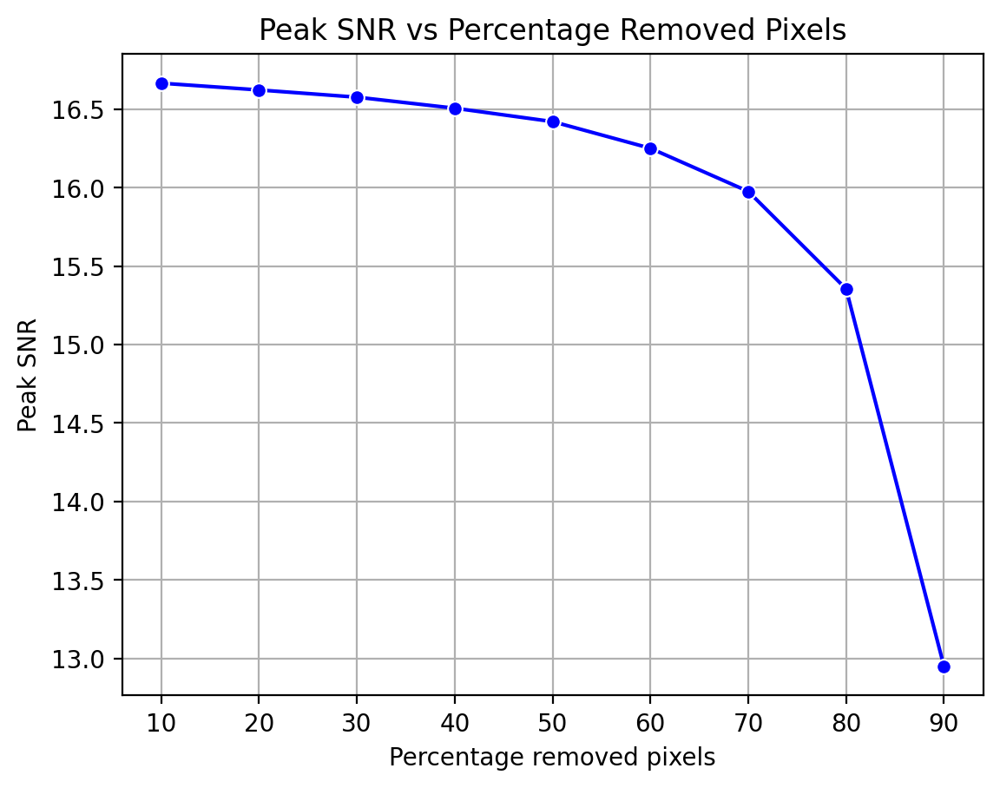

In [50]:
sns.lineplot(x=[10,20,30,40,50,60,70,80,90], y=psnr_arr, marker="o", color="blue")
plt.xlabel("Percentage removed pixels")
plt.ylabel("Peak SNR")
plt.title("Peak SNR vs Percentage Removed Pixels")
plt.grid()
plt.show()

## **Observation :**<br>

The Peak SNR value for 10% data removed is `16.66499` and for the 90% data is `12.94966` which is decreased by `3.71533`.<br> Because of the following points : 

- PSNR decreases with increasing missing data percentage, indicating a degradation in image quality.
- Higher missing data percentages lead to more pronounced PSNR reduction, suggesting a greater loss of information.
- The decrease in PSNR shows how hard it is to guess missing parts of the image well. This affects how faithful the final image looks.